In [1]:
import warnings
import scanpy as sc
import anndata as an
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
from urllib import request
import scanorama
import os

sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.set_figure_params(dpi=120)
sc.settings.set_figure_params(dpi=120)
sc.settings.set_figure_params(dpi=150, facecolor='white')

scanpy==1.9.1 anndata==0.8.0 umap==0.5.3 numpy==1.22.4 scipy==1.9.1 pandas==1.4.2 scikit-learn==1.1.2 statsmodels==0.13.2 python-igraph==0.9.9 louvain==0.7.1 pynndescent==0.5.7


In [2]:
adata = sc.read_h5ad('../results/single_cell/integrated_dataset_SS2_10X.h5ad')

In [4]:
old_to_new = {
'0':'SS2',
'1':'10X',    
}
adata.obs['batch'] = (
adata.obs['batch']
.map(old_to_new)
.astype('category')
)
adata.obs

,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_ribo,pct_counts_ribo,total_counts_hb,pct_counts_hb,n_counts,...,leiden_1.1,louvain_1.2,leiden_1.2,louvain_1.4,leiden_1.4,louvain_1.6,leiden_1.6,day,batch,sample
A10_R1.17_532,851,851,15385.0,0.0,0.0,0.0,0.0,0.0,0.0,15382.0,...,0,5,4,4,5,4,1,D2,SS2,SS2
A10_R1.18_360,1283,1283,31910.0,0.0,0.0,0.0,0.0,0.0,0.0,31910.0,...,1,6,7,1,7,1,10,D4,SS2,SS2
A10_R1.18_361,1863,1863,56389.0,0.0,0.0,0.0,0.0,0.0,0.0,56370.0,...,5,0,6,2,6,7,5,D6,SS2,SS2
A11_R1.17_532,1047,1047,29169.0,0.0,0.0,0.0,0.0,0.0,0.0,29157.0,...,2,3,5,4,4,4,4,D2,SS2,SS2
A11_R1.18_360,1268,1268,23307.0,0.0,0.0,0.0,0.0,0.0,0.0,23306.0,...,3,1,3,1,0,1,0,D4,SS2,SS2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTTGGTAAGGCTG,1305,1305,2225.0,0.0,0.0,0.0,0.0,0.0,0.0,2219.0,...,2,3,16,2,15,15,15,NaN,10X,10X
TTTGTTGGTCGGTGTC,808,808,1239.0,0.0,0.0,0.0,0.0,0.0,0.0,1239.0,...,4,5,3,4,2,4,2,NaN,10X,10X
TTTGTTGGTCGTGGTC,686,686,1148.0,0.0,0.0,0.0,0.0,0.0,0.0,1146.0,...,12,4,12,10,16,3,17,NaN,10X,10X
TTTGTTGGTGAGTTGG,1728,1728,4134.0,0.0,0.0,0.0,0.0,0.0,0.0,4130.0,...,2,3,16,2,15,15,15,NaN,10X,10X


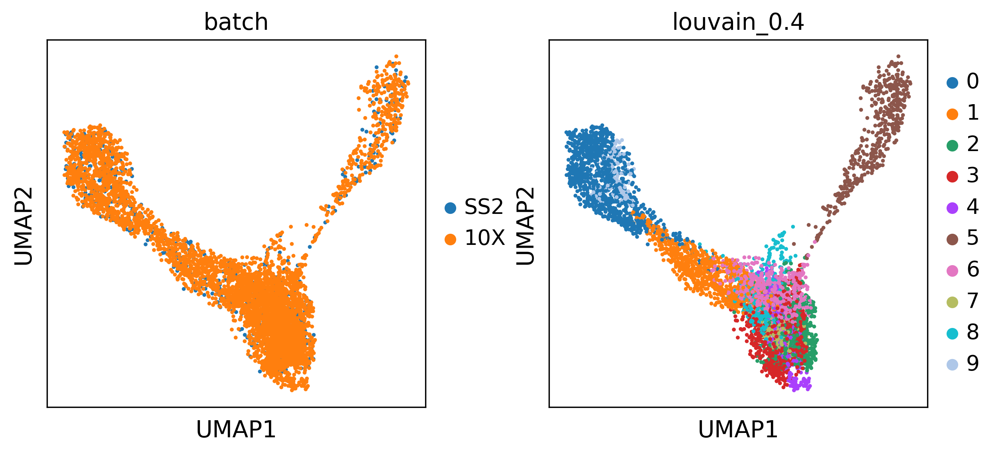

In [4]:
sc.pl.umap(adata, ncols=2, color=['batch', 'louvain_0.4'], projection = '2d')

In [5]:
adata

AnnData object with n_obs × n_vars = 5471 × 4912
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'n_counts', 'S_score', 'G2M_score', 'phase', 'louvain_0.4', 'leiden_0.4', 'louvain_0.6', 'leiden_0.6', 'louvain_0.8', 'leiden_0.8', 'louvain_0.9', 'leiden_0.9', 'louvain_1.0', 'leiden_1.0', 'louvain_1.1', 'leiden_1.1', 'louvain_1.2', 'leiden_1.2', 'louvain_1.4', 'leiden_1.4', 'louvain_1.6', 'leiden_1.6', 'day', 'batch', 'sample', 'clusters'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'batch_colors', 'clusters_colors', 'day_colors', 'dendrogram_clusters', 'hvg', 'leiden', 'leiden_0.4_colors', 'leiden_0.6_colors', 'leiden_0.8_colors', 'leiden_0.9_colors', 'leiden_1.0_colors', 'leiden_1.1_colors', 'leiden_1.2_colors', 'leiden_1.4_colors', 'leiden_1.6_colors', 'log1p', 'louvain', '

In [7]:
print(adata.var_names)

Index(['PF3D7_1401100', 'PF3D7_1401300', 'PF3D7_1401400', 'PF3D7_1401500',
       'PF3D7_1401600', 'PF3D7_1401700', 'PF3D7_1401800', 'PF3D7_1401900',
       'PF3D7_1402000', 'PF3D7_1402100',
       ...
       'PF3D7_0113400', 'PF3D7_0113700', 'PF3D7_0113800', 'PF3D7_0113900',
       'PF3D7_0114000', 'PF3D7_0114500', 'PF3D7_0115000', 'PF3D7_0115100',
       'PF3D7_0115600', 'PF3D7_0115700'],
      dtype='object', length=4912)


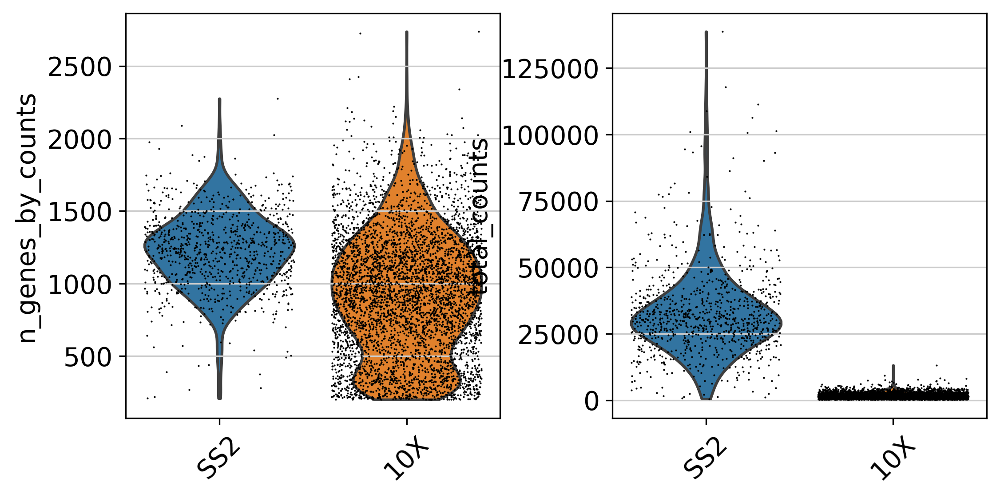

In [8]:
variables = ['n_genes_by_counts', 'total_counts']
sc.pl.violin(adata, variables, jitter=0.4, groupby = 'batch', rotation= 45, wspace = 0.3)

In [9]:

sc.pp.regress_out(adata, ['total_counts'])

regressing out ['total_counts']
    sparse input is densified and may lead to high memory use
    finished (0:00:22)


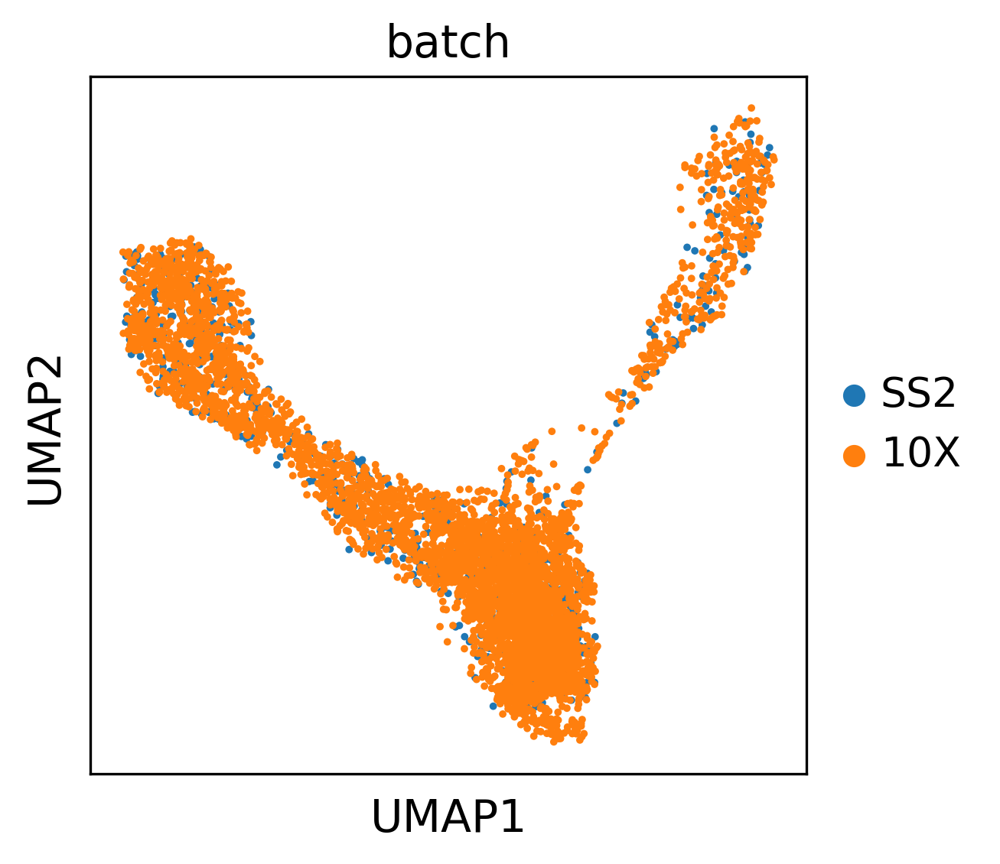

AnnData object with n_obs × n_vars = 5471 × 4912
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'n_counts', 'S_score', 'G2M_score', 'phase', 'louvain_0.4', 'leiden_0.4', 'louvain_0.6', 'leiden_0.6', 'louvain_0.8', 'leiden_0.8', 'louvain_0.9', 'leiden_0.9', 'louvain_1.0', 'leiden_1.0', 'louvain_1.1', 'leiden_1.1', 'louvain_1.2', 'leiden_1.2', 'louvain_1.4', 'leiden_1.4', 'louvain_1.6', 'leiden_1.6', 'day', 'batch', 'sample'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'batch_colors', 'hvg', 'log1p', 'neighbors', 'sample_colors', 'umap', 'louvain_0.4_colors'
    obsm: 'X_pca', 'X_umap', 'scanorama'
    obsp: 'connectivities', 'distances'

In [10]:
sc.pl.umap(adata, color = 'batch', projection = '2d')
adata

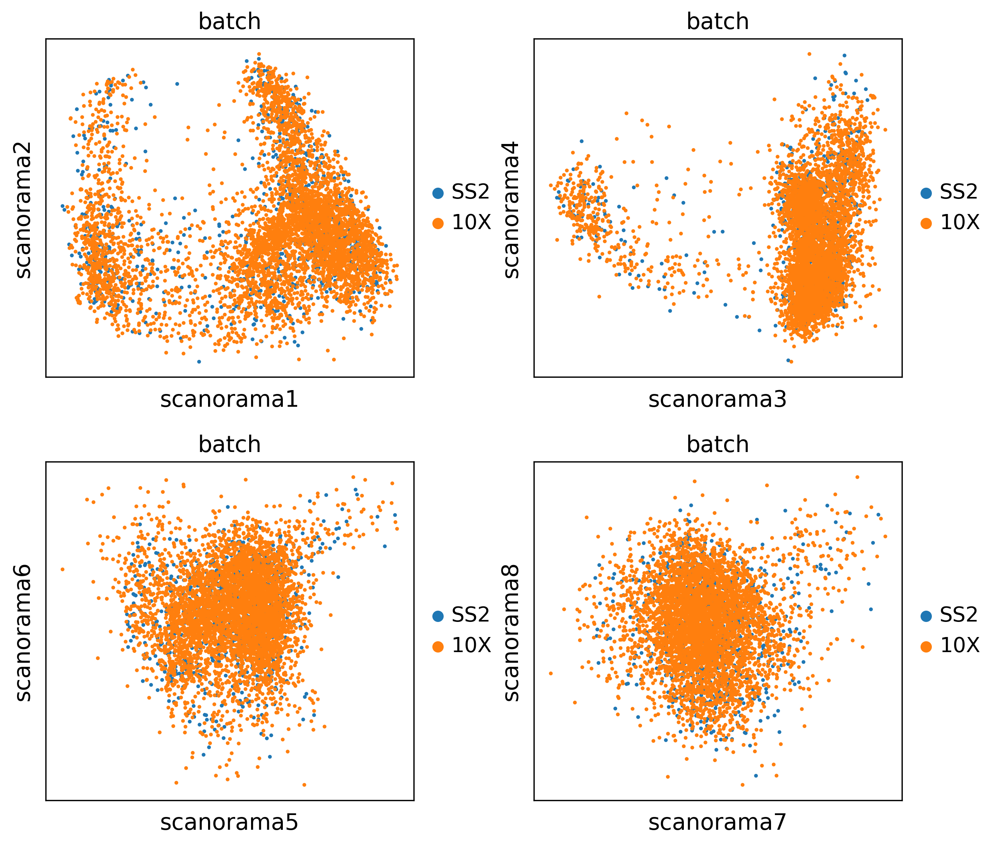

In [11]:
sc.pl.embedding(
    basis='scanorama',
    adata = adata,
    color='batch', 
    components = ['1,2','3,4','5,6','7,8'], 
    ncols=2)

In [91]:
#sc.tl.umap(adata, min_dist=0.3,spread=0.7,maxiter=150)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:03)


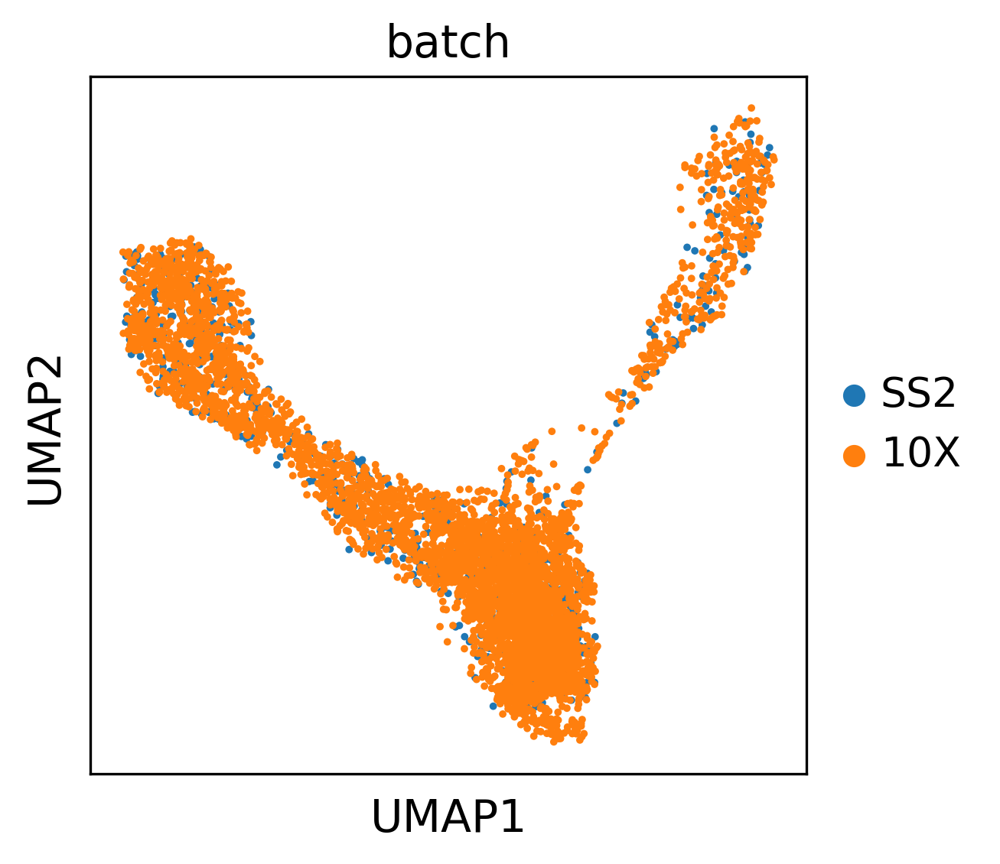

In [5]:
sc.pl.umap(adata, color = 'batch', projection = '2d')

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:03)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 10 clusters and added
    'louvain_0.4', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 11 clusters and added
    'leiden_0.4', the cluster labels (adata.obs, categorical) (0:00:00)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 12 clusters and added
    'louvain_0.6', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 14 clusters and added
    'leiden_0.6', the cluster labels (adata.obs, categorical) (0:00:00)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 13 clusters and added
    'louvain_0.8', the cluster

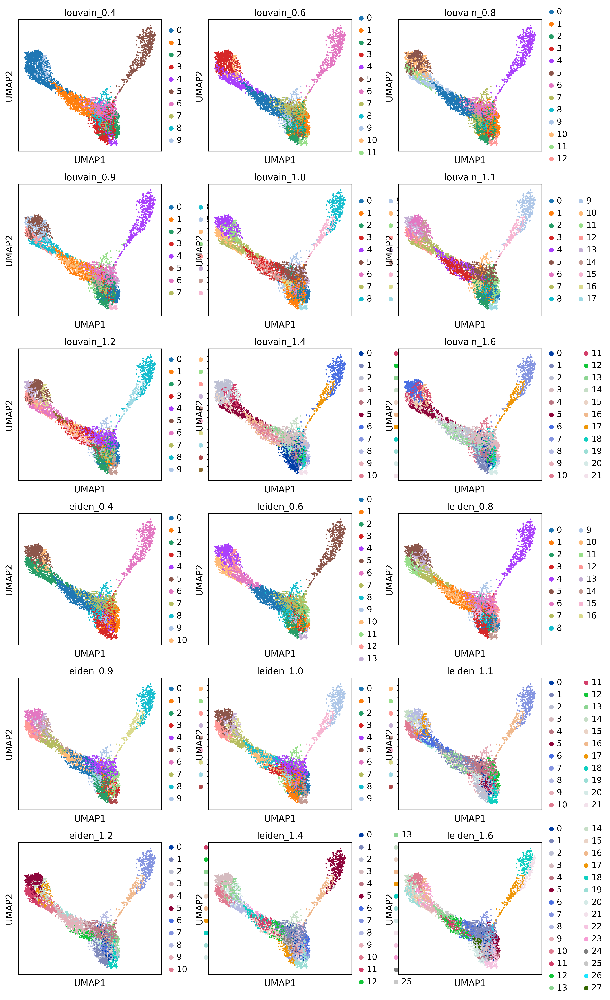

In [18]:
## recalculate neigbours 
sc.pp.neighbors(adata, n_pcs = 10, n_neighbors = 10, use_rep='scanorama')
#sc.tl.umap(adata, min_dist=0.2,spread=0.6,maxiter=150)
resolutions = [0.4,0.6,0.8,0.9,1.0,1.1,1.2,1.4,1.6]
for i in resolutions:
    sc.tl.louvain( adata, resolution = i, key_added = "louvain_"+str(i) )
    sc.tl.leiden(  adata, resolution = i, key_added = "leiden_"+str(i) )
all_clusterings = [ ('louvain_'+str(i)) for i in resolutions] + [ ('leiden_'+str(i)) for i in resolutions ]
sc.pl.umap(adata = adata, color=all_clusterings , ncols=3 )

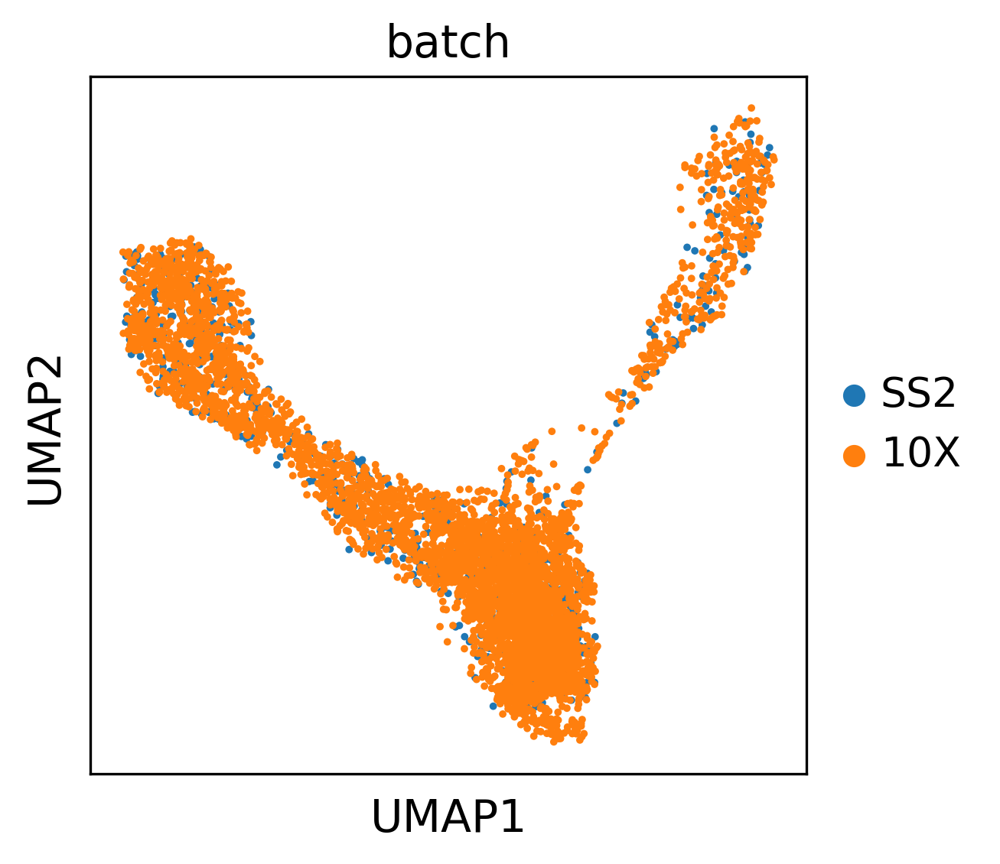

In [36]:
sc.pl.umap(adata, color = 'batch', projection = '2d')

In [24]:
#Dont run if you used prepared object
old_to_new = {
'0':'C0',
'1':'C1',
'2':'C2',
'3':'C3',
'4':'C4',
'5':'C5',
'6':'C6',
'7':'C7',
'8':'C8',
'9':'C9',    
}
adata.obs['clusters'] = (
adata.obs['louvain_0.4']
.map(old_to_new)
.astype('category')
)

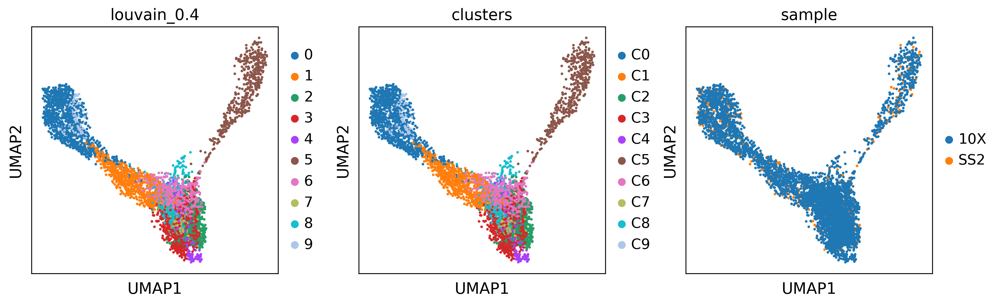

In [25]:
sc.pl.umap(adata, color = ['louvain_0.4', 'clusters', 'sample'], projection = '2d')

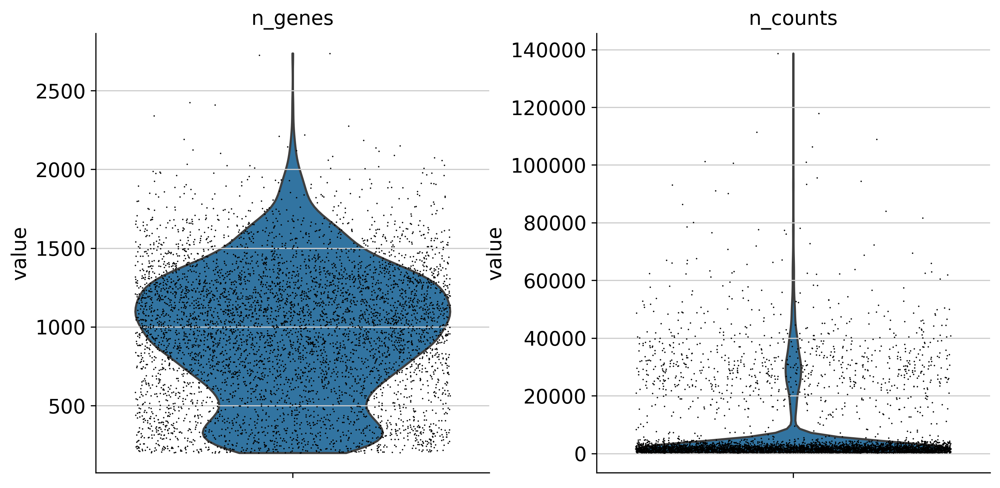

,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_ribo,pct_counts_ribo,total_counts_hb,pct_counts_hb,n_counts,...,louvain_1.2,leiden_1.2,louvain_1.4,leiden_1.4,louvain_1.6,leiden_1.6,day,batch,sample,clusters
A10_R1.17_532,851,851,15385.0,0.0,0.0,0.0,0.0,0.0,0.0,15382.0,...,11,12,12,9,12,8,D2,SS2,SS2,C2
A10_R1.18_360,1283,1283,31910.0,0.0,0.0,0.0,0.0,0.0,0.0,31910.0,...,17,16,17,16,17,17,D4,SS2,SS2,C5
A10_R1.18_361,1863,1863,56389.0,0.0,0.0,0.0,0.0,0.0,0.0,56370.0,...,17,16,17,16,17,17,D6,SS2,SS2,C5
A11_R1.17_532,1047,1047,29169.0,0.0,0.0,0.0,0.0,0.0,0.0,29157.0,...,16,14,11,13,16,16,D2,SS2,SS2,C9
A11_R1.18_360,1268,1268,23307.0,0.0,0.0,0.0,0.0,0.0,0.0,23306.0,...,8,7,6,5,7,18,D4,SS2,SS2,C5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTTGGTAAGGCTG,1305,1305,2225.0,0.0,0.0,0.0,0.0,0.0,0.0,2219.0,...,2,1,0,2,1,2,NaN,10X,10X,C3
TTTGTTGGTCGGTGTC,808,808,1239.0,0.0,0.0,0.0,0.0,0.0,0.0,1239.0,...,9,8,14,14,10,7,NaN,10X,10X,C8
TTTGTTGGTCGTGGTC,686,686,1148.0,0.0,0.0,0.0,0.0,0.0,0.0,1146.0,...,6,19,5,23,5,25,NaN,10X,10X,C0
TTTGTTGGTGAGTTGG,1728,1728,4134.0,0.0,0.0,0.0,0.0,0.0,0.0,4130.0,...,2,1,0,2,1,2,NaN,10X,10X,C3


In [26]:
sc.pl.violin(adata, ['n_genes', 'n_counts'], jitter=0.4, rotation= 45, multi_panel=True)
adata.obs

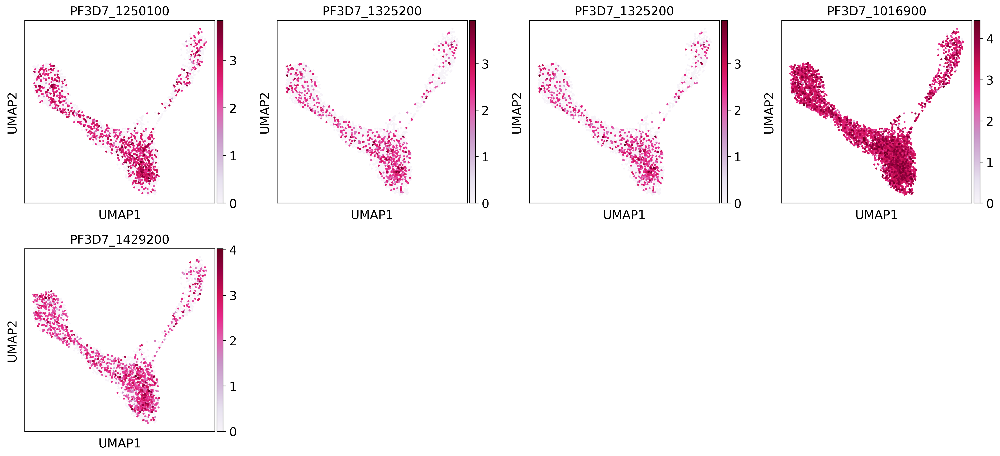

In [19]:
genes = ["PF3D7_1250100", "PF3D7_1325200", "PF3D7_1325200", "PF3D7_1016900", "PF3D7_1429200"]
sc.pl.umap(adata, color = genes, cmap="PuRd", layer = 'counts')

In [28]:
adata = adata.raw.to_adata()
sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)
sc.pp.log1p(adata)

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


ranking genes
    finished: added to `.uns['wilcoxon']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:05)


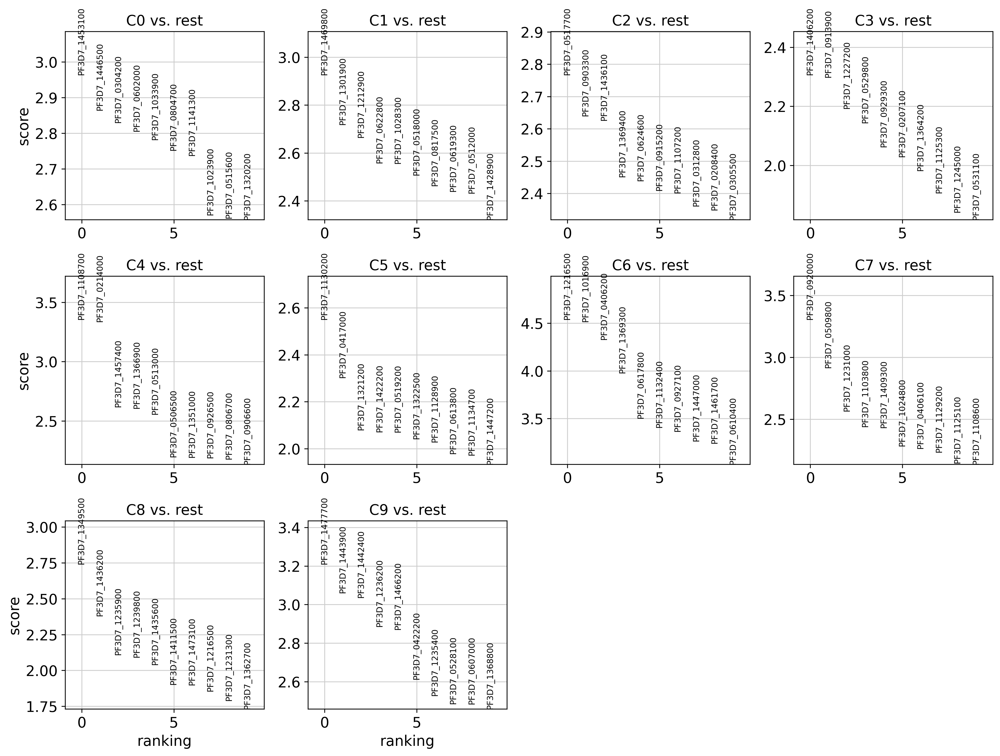

In [29]:
sc.tl.rank_genes_groups(
    adata = adata, 
    groupby = 'clusters', 
    method = 'wilcoxon', 
    use_raw = False, 
    key_added = "wilcoxon",n_genes=100)





sc.pl.rank_genes_groups(adata, n_genes=10, sharey=False, key="wilcoxon")

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_clusters']`


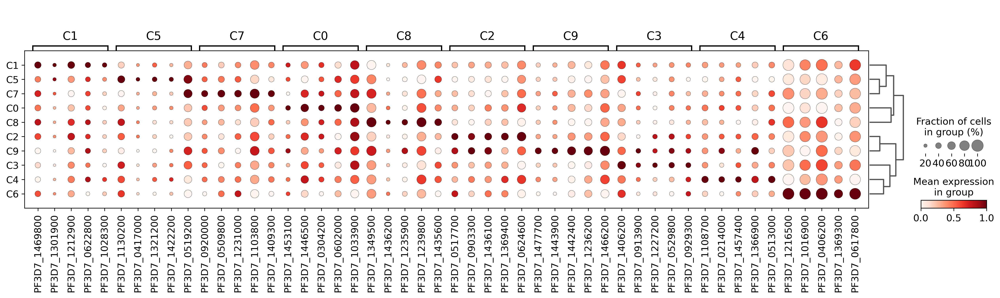

In [31]:
sc.tl.dendrogram(adata, groupby= 'clusters')
sc.pl.rank_genes_groups_dotplot(adata,n_genes=5, standard_scale='var', key="wilcoxon")

In [113]:
#adata = adata.raw.to_adata()

In [13]:
#adata = adata.raw.to_adata()
sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)
sc.pp.log1p(adata)

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


In [15]:
adata.layers["counts"] = adata[adata.obs_names, adata.var_names].X.copy()

In [16]:
%timeit adata.X = adata.layers["counts"]

9.33 µs ± 33.6 ns per loop (mean ± std. dev. of 7 runs, 100,000 loops each)


In [37]:
adata

AnnData object with n_obs × n_vars = 5471 × 4912
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'n_counts', 'S_score', 'G2M_score', 'phase', 'louvain_0.4', 'leiden_0.4', 'louvain_0.6', 'leiden_0.6', 'louvain_0.8', 'leiden_0.8', 'louvain_0.9', 'leiden_0.9', 'louvain_1.0', 'leiden_1.0', 'louvain_1.1', 'leiden_1.1', 'louvain_1.2', 'leiden_1.2', 'louvain_1.4', 'leiden_1.4', 'louvain_1.6', 'leiden_1.6', 'day', 'batch', 'sample', 'clusters', 'male_signature', 'female_signature'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'batch_colors', 'clusters_colors', 'day_colors', 'dendrogram_clusters', 'hvg', 'leiden', 'leiden_0.4_colors', 'leiden_0.6_colors', 'leiden_0.8_colors', 'leiden_0.9_colors', 'leiden_1.0_colors', 'leiden_1.1_colors', 'leiden_1.2_colors', 'leiden_1.4_colors', 'lei

In [38]:
os.makedirs('../results/single_cell', exist_ok=True)
adata.write_h5ad('../results/single_cell/integrated_dataset_SS2_10X_rev.h5ad')

In [15]:
male_genes = [x.strip() for x in open('../male_genes.txt')]
female_genes = [x.strip() for x in open('../female_genes.txt')]

print(len(male_genes))
print(len(female_genes))

6
14


computing score 'male_signature'
    finished: added
    'male_signature', score of gene set (adata.obs).
    248 total control genes are used. (0:00:00)
computing score 'female_signature'


/proj/snic2020-16-146/10xgams/spatial/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/proj/snic2020-16-146/10xgams/spatial/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


    finished: added
    'female_signature', score of gene set (adata.obs).
    397 total control genes are used. (0:00:00)


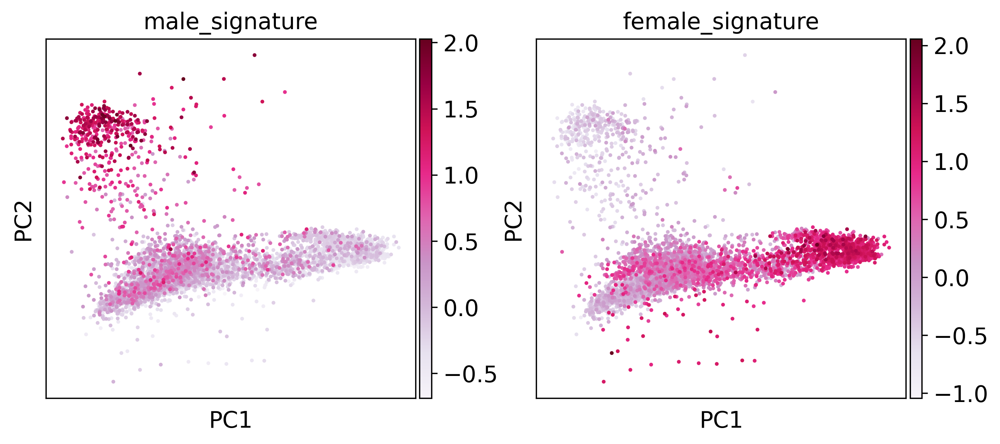

In [27]:
sc.tl.score_genes(adata, male_genes, score_name='male_signature')
sc.tl.score_genes(adata, female_genes, score_name='female_signature')


sc.pl.pca(adata, color= ['male_signature', 'female_signature'], color_map='PuRd', add_outline=False, legend_loc='on data',
               legend_fontsize=12, legend_fontoutline=2,frameon=True, projection = '2d')
#sc.pl.violin(adata, ['male_signature', 'female_signature'], jitter=0.4, groupby = 'clusters', rotation=45, stripplot=False, inner='box')
#sc.pl.violin(adata, ['male_signature', 'female_signature'], jitter=0.4, groupby = 'cell_class', rotation=45, stripplot=False, inner='box')

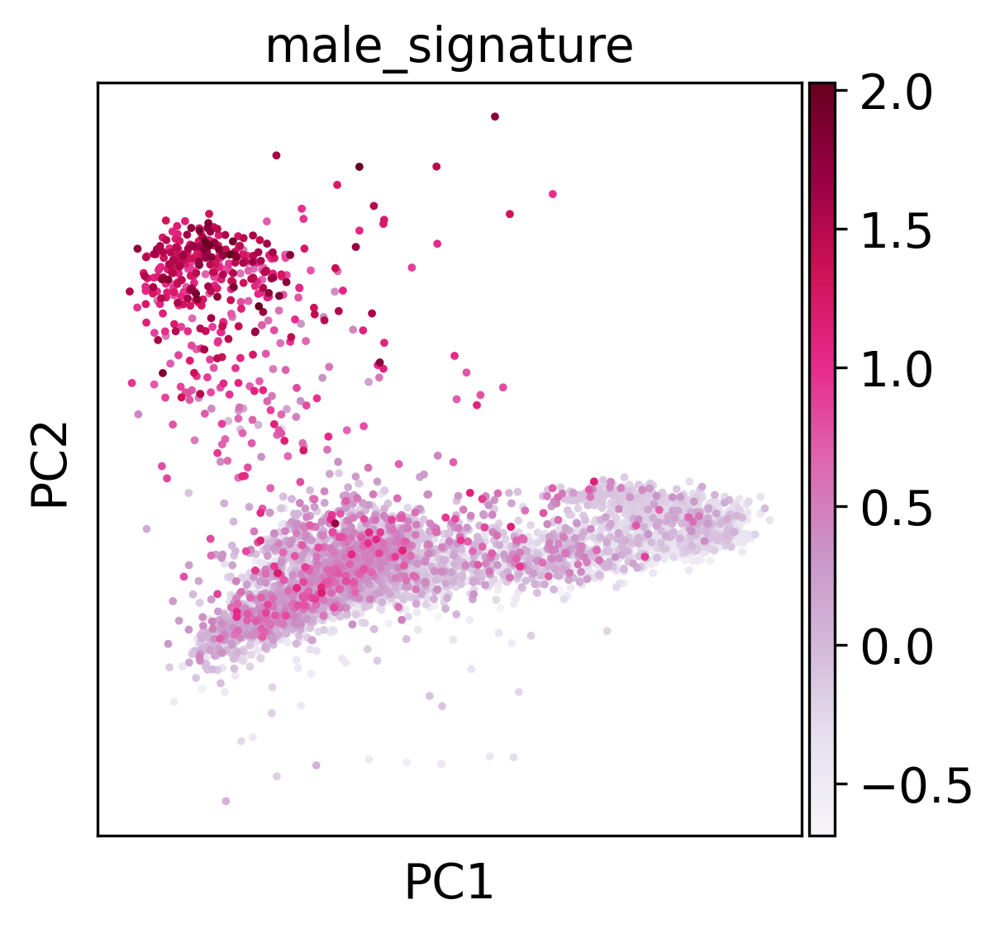

In [32]:
sc.pl.pca(adata, color = ['male_signature'], cmap="PuRd")